# MMD-GAN on CIFAR-10
This notebook adapts the 2D MMD-GAN to the CIFAR-10 image dataset.

Key changes from the 2D version:
- **Generator**: now a transposed-convolution (DCGAN-style) network producing 3×32×32 images
- **Discriminator / Critic encoder**: a convolutional encoder that maps images to a latent feature space where MMD is computed
- **MMD with two RBF kernels** (multi-scale): one fine-grained, one coarse-grained, summed together
- Data: CIFAR-10 loaded via `torchvision`

## 1. Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms
from torchvision.utils import make_grid

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


## 2. Load CIFAR-10

100%|██████████| 170M/170M [00:13<00:00, 12.8MB/s]


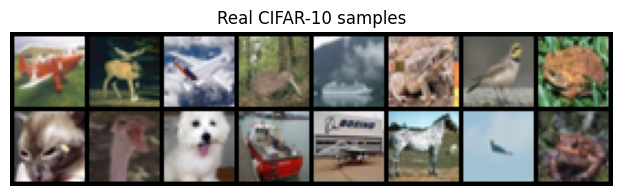

In [2]:
# CIFAR-10 images are 3×32×32, pixel values in [0,1]
# We normalise to [-1, 1] so the generator output (tanh) matches
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))   # → [-1, 1]
])

batch_size =1024

trainset = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=transform
)
dataloader = torch.utils.data.DataLoader(
    trainset, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=True
)

# Quick visualisation of a batch of real images
real_batch, _ = next(iter(dataloader))
grid = make_grid(real_batch[:16], nrow=8, normalize=True)
plt.figure(figsize=(10, 2))
plt.imshow(grid.permute(1, 2, 0).cpu())
plt.axis('off')
plt.title('Real CIFAR-10 samples')
plt.show()

## 3. Generator architecture (DCGAN-style)

Input: latent noise vector `z` of dimension `n_z`  
Output: image tensor of shape `(B, 3, 32, 32)` in `[-1, 1]`

In [3]:
class Generator(nn.Module):
    """Transposed-convolution generator: z ∈ R^n_z → image ∈ R^{3×32×32}."""

    def __init__(self, n_z=128, ngf=64):
        super().__init__()
        # Project and reshape: z → (ngf*8) × 2 × 2
        self.project = nn.Sequential(
            nn.Linear(n_z, ngf * 8 * 2 * 2),
            nn.BatchNorm1d(ngf * 8 * 2 * 2),
            nn.ReLU(True)
        )
        self.ngf = ngf

        # 2×2 → 4×4 → 8×8 → 16×16 → 32×32
        self.conv = nn.Sequential(
            # (ngf*8) × 2 × 2  →  (ngf*4) × 4 × 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # (ngf*4) × 4 × 4  →  (ngf*2) × 8 × 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # (ngf*2) × 8 × 8  →  ngf × 16 × 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # ngf × 16 × 16  →  3 × 32 × 32
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

        self.apply(self._init_weights)

    def forward(self, z):
        h = self.project(z)
        h = h.view(-1, self.ngf * 8, 2, 2)
        return self.conv(h)

    @staticmethod
    def _init_weights(m):
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
            nn.init.normal_(m.weight, 0.0, 0.02)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.normal_(m.weight, 1.0, 0.02)
            nn.init.zeros_(m.bias)


# Sanity check
n_z = 128
G_test = Generator(n_z=n_z).to(device)
z_test = torch.randn(4, n_z, device=device)
out_test = G_test(z_test)
print('Generator output shape:', out_test.shape)   # should be (4, 3, 32, 32)

Generator output shape: torch.Size([4, 3, 32, 32])


## 4. Encoder / Feature extractor

In the image-space MMD-GAN the kernel is **not** computed in pixel space (too high-dimensional and poor inductive bias).  
Instead we use a **learned encoder** `E` that maps images to a compact feature vector, and compute MMD in that feature space.

The encoder is trained jointly with the generator so that the features remain discriminative.

In [4]:
import torchvision.models as models

class ResNetEncoder(nn.Module):
    """ResNet-18 adapted for CIFAR-10: image ∈ R^{3×32×32} → feature ∈ R^feat_dim."""

    def __init__(self, feat_dim=256):
        super().__init__()
        # Load standard ResNet-18 without pre-trained weights
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

        # CIFAR-10 adaptation: Change 7x7 conv with stride 2 to 3x3 conv with stride 1
        self.resnet.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)

        # CIFAR-10 adaptation: Remove maxpool since 32x32 is already small
        self.resnet.maxpool = nn.Identity()

        # Replace final fully connected layer to map to your MMD feature dimension
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, feat_dim)

    def forward(self, x):
        return self.resnet(x)

# Sanity check
feat_dim = 256
E_test = ResNetEncoder(feat_dim=feat_dim).to(device)
img_test = torch.randn(4, 3, 32, 32, device=device)
feat_test = E_test(img_test)
print('ResNet Encoder output shape:', feat_test.shape)   # should be (4, 256)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 220MB/s]


ResNet Encoder output shape: torch.Size([4, 256])


## 5. Kernel functions and MMD

We use a **mixture of two RBF kernels** (as in the original MMD-GAN paper) to get a richer, scale-invariant discrepancy measure.

$$k(x, y) = k_{\sigma_1}(x,y) + k_{\sigma_2}(x,y)$$

In [11]:
def distance_sq_kernel(X,Y):
  X_ = X.unsqueeze(1)   # (m, 1, d)
  Y_ = Y.unsqueeze(0)   # (1, n, d)
  dist_sq = (X_ - Y_).pow(2).sum(2)
  return -dist_sq

In [14]:
def quadratic_rational_kernel(X, Y, alpha=1.0):
    """
    Quadratic Rational kernel matrix.
    K(x, y) = alpha / (alpha + ||x - y||^2)
    X: (m, d), Y: (n, d) → (m, n)
    """
    X_ = X.unsqueeze(1)   # (m, 1, d)
    Y_ = Y.unsqueeze(0)   # (1, n, d)
    dist_sq = (X_ - Y_).pow(2).sum(2)   # (m, n)
    return alpha / (alpha + dist_sq)


def quadratic_rational_kernel_batch(X, Y, alpha=1.0):
    X_ = X.unsqueeze(2)   # (m, 1, d)
    Y_ = Y.unsqueeze(1)   # (1, n, d)
    dist_sq = (X_ - Y_).pow(2).sum(3)   # (m, n)
    return alpha / (alpha + dist_sq)

def mmd_multiscale(X, Y, alphas=(1.0, 2.0)):
    """
    Biased MMD^2 estimator using a mixture of Quadratic Rational kernels.
    Returns the maximum MMD across different alpha values, then sqrt.
    X: (m, d) fake features, Y: (n, d) real features.
    """
    mmd_values = []
    for alpha in alphas:
        K_XX = distance_sq_kernel(X, X)
        K_YY = distance_sq_kernel(Y, Y)
        K_XY = distance_sq_kernel(X, Y)
        mmd2 = K_XX.mean() + K_YY.mean() - 2.0 * K_XY.mean()
        mmd_values.append(torch.sqrt(torch.relu(mmd2)))
    return torch.max(torch.stack(mmd_values))

def mmd_multiscale_batch(X, Y, alphas=(1.0, 2.0)):
    """
    Biased MMD^2 estimator using a mixture of Quadratic Rational kernels.
    Returns the maximum MMD across different alpha values, then sqrt.
    X: (m, d) fake features, Y: (n, d) real features.
    """
    mmd_values = []
    for alpha in alphas:
        K_XX = quadratic_rational_kernel_batch(X, X)
        K_YY = quadratic_rational_kernel_batch(Y, Y)
        K_XY = quadratic_rational_kernel_batch(X, Y)
        mmd2 = K_XX.mean() + K_YY.mean() - 2.0 * K_XY.mean()
        mmd_values.append(torch.sqrt(torch.relu(mmd2)))
    return torch.max(torch.stack(mmd_values))

# Quick test
a = torch.randn(32, feat_dim, device=device)
b_ = torch.randn(32, feat_dim, device=device)
print('MMD (random vs random):', mmd_multiscale(a, b_).item())

MMD (random vs random): 7.4841628074646


## 6. Training

### Training objective

- **Encoder `E`** is trained to **maximise** MMD in feature space (so it learns discriminative features).
- **Generator `G`** is trained to **minimise** MMD in feature space.

Both are updated at each iteration, which is the standard MMD-GAN training scheme.  
The encoder loss uses `-MMD` (negated) to push real and fake features apart.

In [20]:
def gradient_penalty_encoder(encoder, real, fake, device):
    batch_size = real.size(0)

    eps = torch.rand(batch_size, 1, 1, 1, device=device)
    interp = eps * real + (1 - eps) * fake
    interp.requires_grad_(True)

    feat = encoder(interp)

    # scalar per sample
    feat_norm = feat.pow(2).sum(dim=1).sqrt()

    gradients = torch.autograd.grad(
        outputs=feat_norm,
        inputs=interp,
        grad_outputs=torch.ones_like(feat_norm),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    gradients = gradients.view(batch_size, -1)

    gp = ((gradients.norm(2, dim=1) - 1) ** 2).mean()

    return gp

Starting training...
[1/100][0/48]  MMD(fake‖real): 0.2461
[2/100][0/48]  MMD(fake‖real): 0.6730


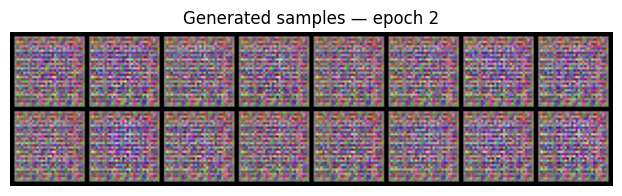

[3/100][0/48]  MMD(fake‖real): 0.8651
[4/100][0/48]  MMD(fake‖real): 0.9084


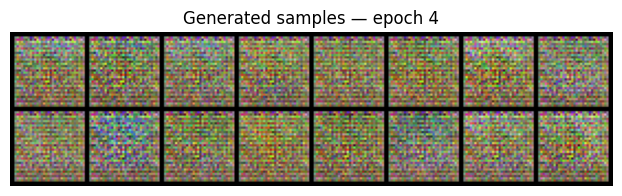

[5/100][0/48]  MMD(fake‖real): 4.0491
[6/100][0/48]  MMD(fake‖real): 3.9405


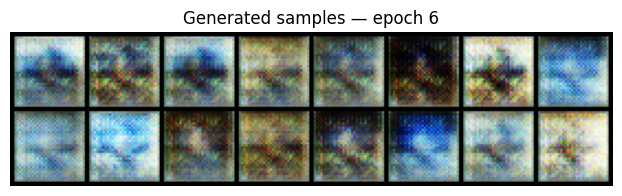

[7/100][0/48]  MMD(fake‖real): 17.5894
[8/100][0/48]  MMD(fake‖real): 36.8635


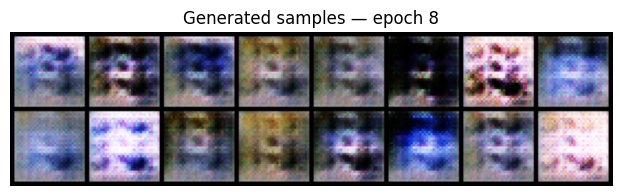

[9/100][0/48]  MMD(fake‖real): 3.1180
[10/100][0/48]  MMD(fake‖real): 7.3691


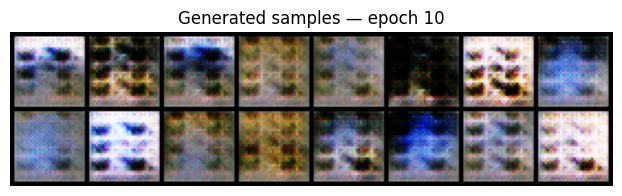

[11/100][0/48]  MMD(fake‖real): 0.8095
[12/100][0/48]  MMD(fake‖real): 29.6093


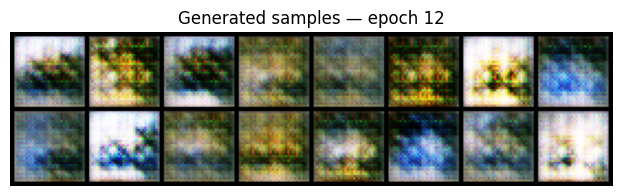

[13/100][0/48]  MMD(fake‖real): 37.4028
[14/100][0/48]  MMD(fake‖real): 106.2741


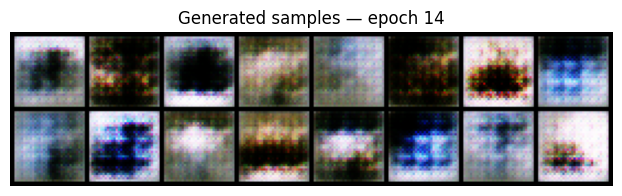

[15/100][0/48]  MMD(fake‖real): 22.0931
[16/100][0/48]  MMD(fake‖real): 56.5834


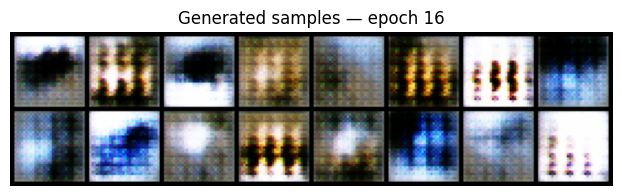

[17/100][0/48]  MMD(fake‖real): 3.9036
[18/100][0/48]  MMD(fake‖real): 168.8791


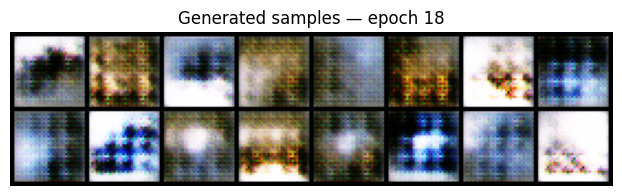

[19/100][0/48]  MMD(fake‖real): 26.6755
[20/100][0/48]  MMD(fake‖real): 142.0691


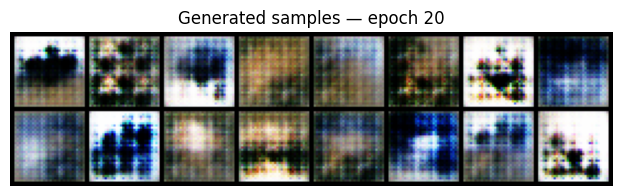

[21/100][0/48]  MMD(fake‖real): 33.1801
[22/100][0/48]  MMD(fake‖real): 124.6794


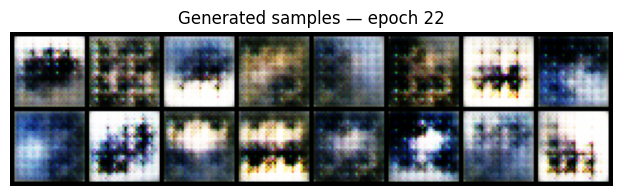

[23/100][0/48]  MMD(fake‖real): 1.8425
[24/100][0/48]  MMD(fake‖real): 111.2489


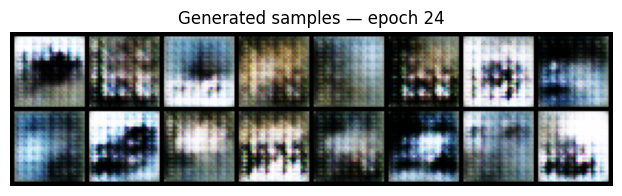

[25/100][0/48]  MMD(fake‖real): 82.3151
[26/100][0/48]  MMD(fake‖real): 12.8548


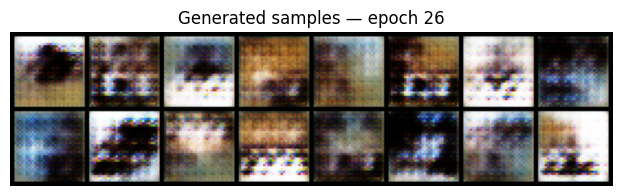

[27/100][0/48]  MMD(fake‖real): 130.9067
[28/100][0/48]  MMD(fake‖real): 15.8515


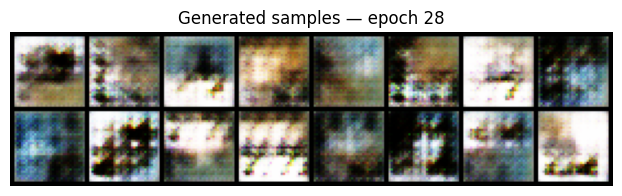

[29/100][0/48]  MMD(fake‖real): 6.5491
[30/100][0/48]  MMD(fake‖real): 41.4988


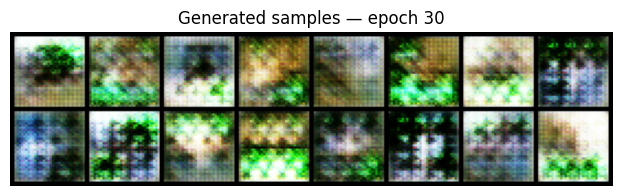

[31/100][0/48]  MMD(fake‖real): 4.1411
[32/100][0/48]  MMD(fake‖real): 197.6551


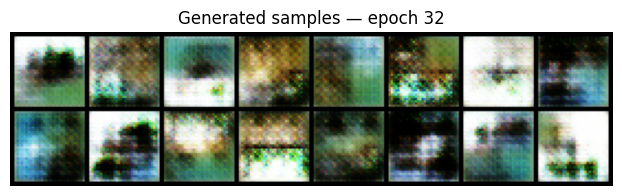

[33/100][0/48]  MMD(fake‖real): 2.6048
[34/100][0/48]  MMD(fake‖real): 2.1362


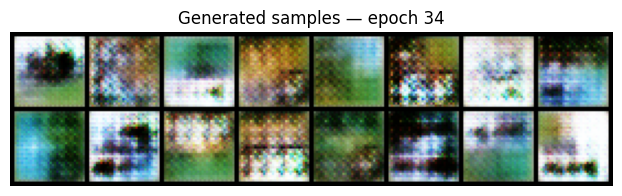

[35/100][0/48]  MMD(fake‖real): 13.6746
[36/100][0/48]  MMD(fake‖real): 17.0045


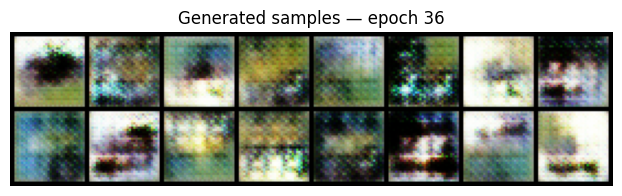

[37/100][0/48]  MMD(fake‖real): 1.1520
[38/100][0/48]  MMD(fake‖real): 1.8350


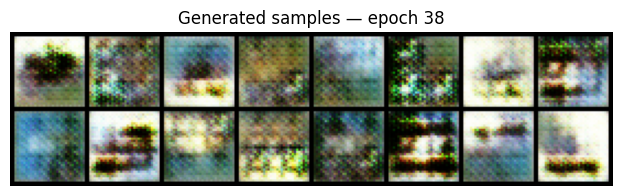

[39/100][0/48]  MMD(fake‖real): 4.2149
[40/100][0/48]  MMD(fake‖real): 96.5669


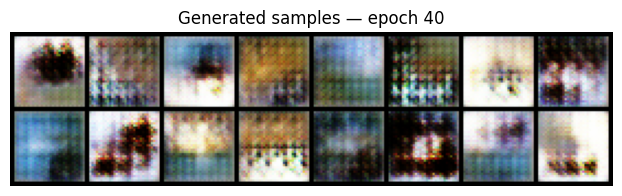

[41/100][0/48]  MMD(fake‖real): 3.3821
[42/100][0/48]  MMD(fake‖real): 1.8044


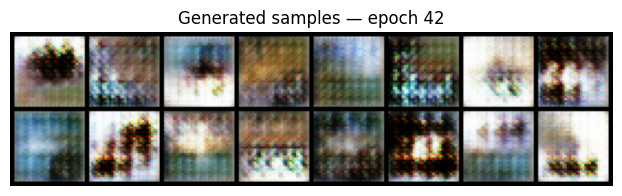

[43/100][0/48]  MMD(fake‖real): 4.6020
[44/100][0/48]  MMD(fake‖real): 3.0667


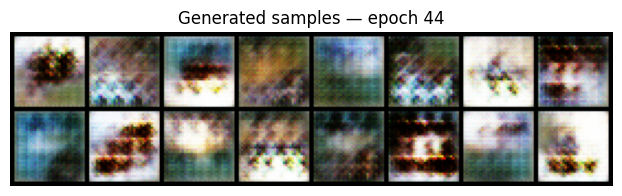

[45/100][0/48]  MMD(fake‖real): 30.2010
[46/100][0/48]  MMD(fake‖real): 30.3785


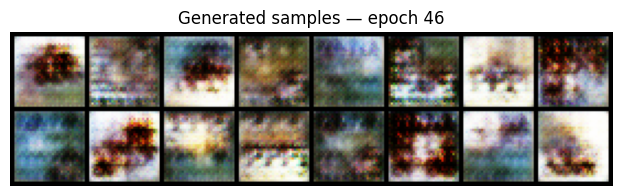

[47/100][0/48]  MMD(fake‖real): 3.6709
[48/100][0/48]  MMD(fake‖real): 71.2002


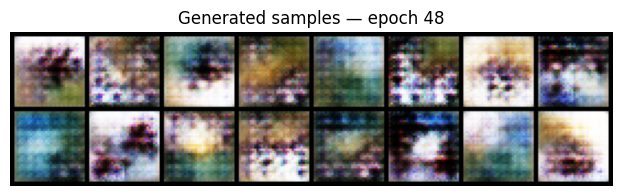

[49/100][0/48]  MMD(fake‖real): 128.6900
[50/100][0/48]  MMD(fake‖real): 2.9142


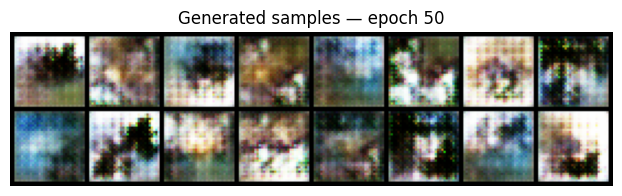

[51/100][0/48]  MMD(fake‖real): 19.4875
[52/100][0/48]  MMD(fake‖real): 54.8740


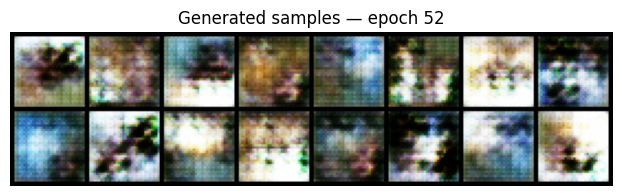

[53/100][0/48]  MMD(fake‖real): 42.4353
[54/100][0/48]  MMD(fake‖real): 2.8944


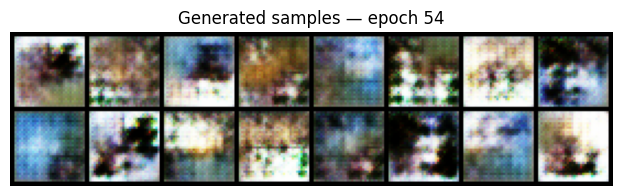

[55/100][0/48]  MMD(fake‖real): 120.7532
[56/100][0/48]  MMD(fake‖real): 2.4967


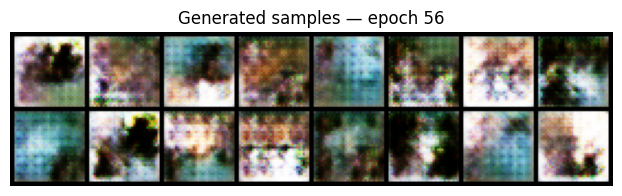

[57/100][0/48]  MMD(fake‖real): 9.8550
[58/100][0/48]  MMD(fake‖real): 38.9769


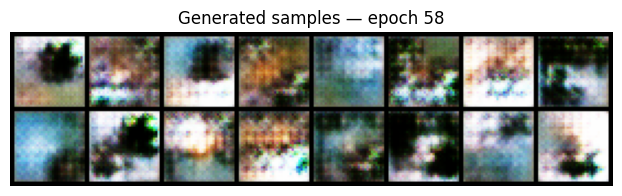

[59/100][0/48]  MMD(fake‖real): 1.1166
[60/100][0/48]  MMD(fake‖real): 6.2922


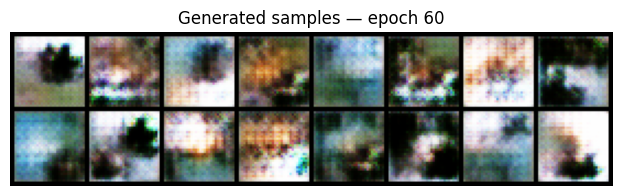

[61/100][0/48]  MMD(fake‖real): 8.3104
[62/100][0/48]  MMD(fake‖real): 63.1027


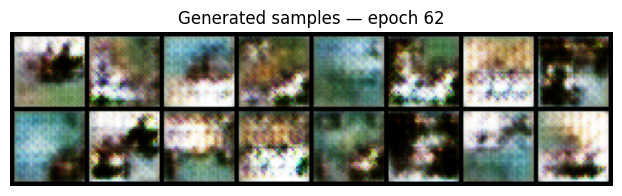

[63/100][0/48]  MMD(fake‖real): 4.7562
[64/100][0/48]  MMD(fake‖real): 123.9350


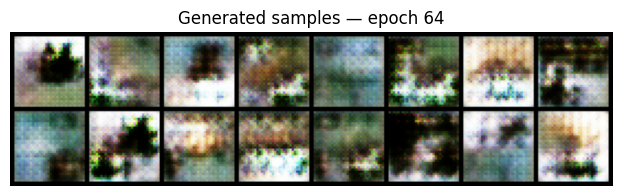

[65/100][0/48]  MMD(fake‖real): 42.0260
[66/100][0/48]  MMD(fake‖real): 0.7993


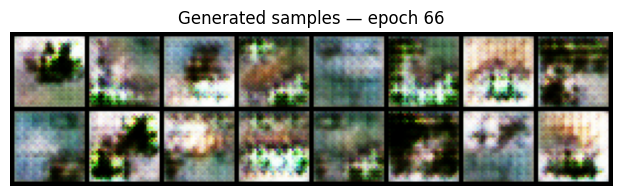

[67/100][0/48]  MMD(fake‖real): 1.8457
[68/100][0/48]  MMD(fake‖real): 14.2051


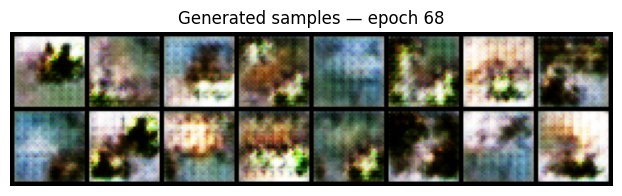

[69/100][0/48]  MMD(fake‖real): 71.6025
[70/100][0/48]  MMD(fake‖real): 9.6441


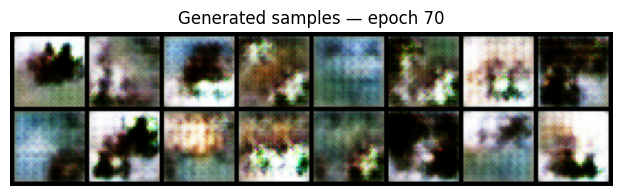

[71/100][0/48]  MMD(fake‖real): 14.7045
[72/100][0/48]  MMD(fake‖real): 30.1478


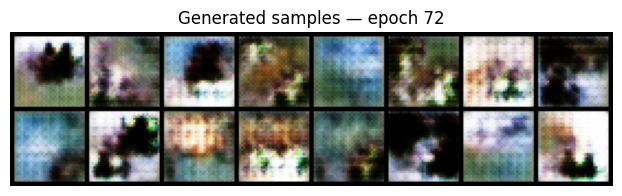

[73/100][0/48]  MMD(fake‖real): 41.8137
[74/100][0/48]  MMD(fake‖real): 2.7995


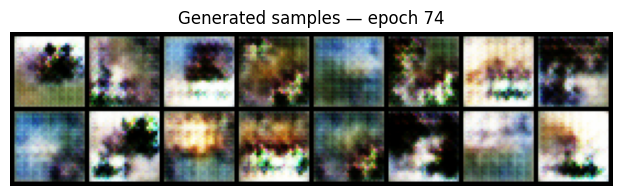

[75/100][0/48]  MMD(fake‖real): 42.9607
[76/100][0/48]  MMD(fake‖real): 26.4811


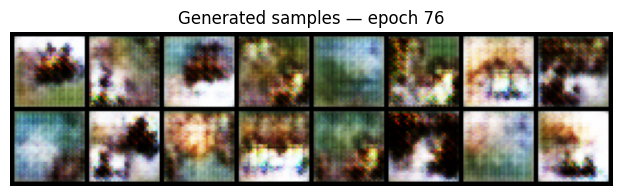

[77/100][0/48]  MMD(fake‖real): 75.2020
[78/100][0/48]  MMD(fake‖real): 19.3809


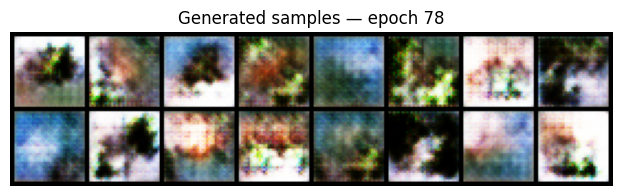

[79/100][0/48]  MMD(fake‖real): 11.5964
[80/100][0/48]  MMD(fake‖real): 10.0464


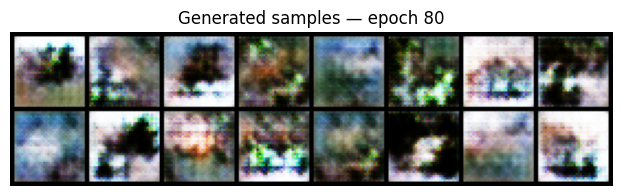

[81/100][0/48]  MMD(fake‖real): 9.0099
[82/100][0/48]  MMD(fake‖real): 1.1326


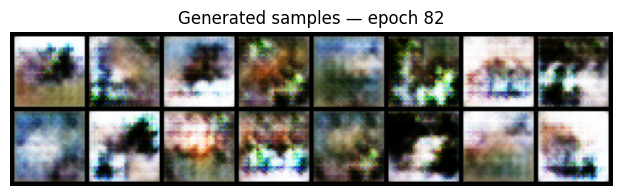

[83/100][0/48]  MMD(fake‖real): 1.6343
[84/100][0/48]  MMD(fake‖real): 12.3351


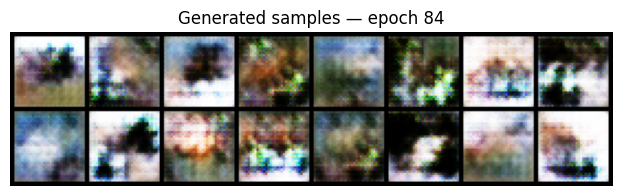

[85/100][0/48]  MMD(fake‖real): 1.1434


In [ ]:
# ── Hyperparameters ──────────────────────────────────────────────
n_z      = 512      # latent dimension
ngf      = 128         # generator base channel count
ndf      = 128         # encoder base channel count
feat_dim = 512  # feature space dimension for MMD
# Instead of just two, use a diverse mix of bandwidths
alphas = [0.01,0.1,10,100,500] # kernel alpha values

lr_G     = 1e-4
lr_E     = 2e-4
beta1    = 0.5
beta2    = 0.999

n_epochs       = 100
n_enc_per_gen = 5    # encoder updates per generator update
log_every      = 200  # iterations
show_every     = 2    # epochs

torch.manual_seed(42)

# ── Models ───────────────────────────────────────────────────────
G = Generator(n_z=n_z, ngf=ngf).to(device)
E = ResNetEncoder(feat_dim=feat_dim).to(device)

opt_G = optim.Adam(G.parameters(), lr=lr_G, betas=(beta1, beta2))
opt_E = optim.Adam(E.parameters(), lr=lr_E, betas=(beta1, beta2))

# Fixed noise for visualisation across epochs
fixed_z = torch.randn(16, n_z, device=device)

G_losses, E_losses = [], []

print('Starting training...')
for epoch in range(1, n_epochs + 1):
    for i, (real_imgs, _) in enumerate(dataloader):
        real_imgs = real_imgs.to(device)   # (B, 3, 32, 32)
        B = real_imgs.size(0)

        # ── 1. Update Encoder (maximise MMD → minimise -MMD) ────
        # ── 1. Update Encoder (maximise MMD → minimise -MMD) ────
        for j in range(n_enc_per_gen ):
            opt_E.zero_grad()

            # Generate fake samples and detach them so gradients don't flow back into G
            z = torch.randn(B, n_z, device=device)
            fake_imgs = G(z).detach()

            # Extract features for both real and fake images using the Encoder
            real_feat = E(real_imgs)
            fake_feat = E(fake_imgs)
            lambda_gp = 10

            mmd_loss = mmd_multiscale(real_feat, fake_feat)

            gp = gradient_penalty_encoder(
                E,
                real_imgs,
                fake_imgs.detach(),
                device
            )

            loss_E = -mmd_loss + lambda_gp * gp

            loss_E.backward()
            opt_E.step()
            # Since standard optimizers minimize loss, we minimize the NEGATIVE MMD to maximize distance


            # Store the actual positive MMD distance for plotting
            E_losses.append(-e_loss.item())
        # ── 2. Update Generator (minimise MMD) ──────────────────

        opt_G.zero_grad()
        z = torch.randn(B, n_z, device=device)
        fake_imgs = G(z)
        real_feat = E(real_imgs).detach()   # stop grad through encoder
        fake_feat = E(fake_imgs)
        g_loss = mmd_multiscale(fake_feat, real_feat, alphas)
        g_loss.backward()
        opt_G.step()

        G_losses.append(g_loss.item())
        # store the positive MMD value

        if i % log_every == 0:
            print(f'[{epoch}/{n_epochs}][{i}/{len(dataloader)}]  '
                  f'MMD(fake‖real): {g_loss.item():.4f}')

    # ── Visualisation every few epochs ──────────────────────────
    if epoch % show_every == 0:
        G.eval()
        with torch.no_grad():
            sample = G(fixed_z).cpu()
        G.train()
        grid = make_grid(sample, nrow=8, normalize=True)
        plt.figure(figsize=(10, 2))
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis('off')
        plt.title(f'Generated samples — epoch {epoch}')
        plt.show()

## 7. Loss curves

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
axs[0].plot(G_losses)
axs[0].set_title('Generator MMD loss')
axs[0].set_xlabel('Iteration')

axs[1].plot(E_losses, color='orange')
axs[1].set_title('Encoder MMD (feature separation)')
axs[1].set_xlabel('Iteration')

plt.tight_layout()
plt.show()

## 8. Final generated samples vs. real

In [ ]:
G.eval()
with torch.no_grad():
    fake = G(torch.randn(32, n_z, device=device)).cpu()

real_sample, _ = next(iter(dataloader))
real_sample = real_sample[:32]

grid_fake = make_grid(fake, nrow=8, normalize=True)
grid_real = make_grid(real_sample, nrow=8, normalize=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].imshow(grid_real.permute(1, 2, 0))
axes[0].set_title('Real CIFAR-10')
axes[0].axis('off')

axes[1].imshow(grid_fake.permute(1, 2, 0))
axes[1].set_title('Generated by MMD-GAN')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 9. Save checkpoint

In [ ]:
torch.save({'G': G.state_dict(), 'E': E.state_dict()}, 'mmdgan_cifar10.pt')
print('Checkpoint saved to mmdgan_cifar10.pt')

## Notes on differences from the 2D version

| Aspect | 2D synthetic | CIFAR-10 |
|---|---|---|
| Data | 6–100 2D points | 50 000 colour images 3×32×32 |
| Generator | MLP + Sigmoid | Transposed-conv + BatchNorm + Tanh |
| Encoder/Critic | MLP | Conv net mapping images → feature vectors |
| MMD space | Pixel / data space | Learned feature space |
| Kernels | Single RBF or rational-quadratic | Sum of two RBF (multi-scale) |
| Encoder objective | Not used | Maximise MMD (push real & fake apart) |
| σ sensitivity | High (discussed in notebook) | Reduced by using two scales and feature space |

**Tips for further improvement:**
- Increase `n_epochs` (100–200) for sharper images.
- Try more kernel bandwidths: `sigmas=(0.5, 1.0, 2.0, 4.0)`.
- Add a **gradient penalty** on the encoder to stabilise training.
- Use **spectral normalisation** on encoder layers.
- Replace the linear projection in the generator with a `ConvTranspose2d` for cleaner spatial structure.